In [16]:
import pandas as pd
import numpy as np

# Load and clean global fault data

In [17]:
# Load global fault data
faults = pd.read_csv('data/ordered_rectangles_final.csv')
faults = faults.drop(['Unnamed: 0'], axis=1) # remove unnecessary column

# Drop rows of NaN's - they serve no purpose here
faults = faults.dropna()

# Because of the original use of the data, every row appears twice, but we don't need that here
# Remove duplicate rows
faults = faults.drop_duplicates()

# Reset dataframe index
faults = faults.reset_index(drop=True) # drop old index

# View data
faults

,lon1,lat1,dep1,lon2,lat2,dep2,lon3,lat3,dep3,lon4,lat4,dep4
0,358.257,71.685,0.0,359.025,71.815,0.0,358.257000,71.685000,15.0,359.025000,71.815000,15.0
1,357.601,71.592,0.0,358.257,71.685,0.0,357.601000,71.592000,15.0,358.257000,71.685000,15.0
2,357.063,71.500,0.0,357.601,71.592,0.0,357.063000,71.500000,15.0,357.601000,71.592000,15.0
3,356.308,71.398,0.0,357.063,71.500,0.0,356.308000,71.398000,15.0,357.063000,71.500000,15.0
4,355.928,71.490,0.0,356.308,71.398,0.0,355.928000,71.490000,15.0,356.308000,71.398000,15.0
...,...,...,...,...,...,...,...,...,...,...,...,...
8629,76.943,42.720,0.0,77.168,42.738,0.0,76.931435,42.797853,15.0,77.156435,42.815853,15.0
8630,76.690,42.708,0.0,76.943,42.720,0.0,76.683046,42.786152,15.0,76.936046,42.798152,15.0
8631,76.521,42.706,0.0,76.690,42.708,0.0,76.519196,42.784310,15.0,76.688196,42.786310,15.0
8632,76.270,42.719,0.0,76.521,42.706,0.0,76.277261,42.797137,15.0,76.528261,42.784137,15.0


# Add "danger index" column

The maximum-strength earthquake a fault can produce is a function of its surface area. In cross-section, if you think of a fault's "height" as its depth (column dep3) and its "width" as the distance between (lon1, lat1) and (lon3, lat3), then the underground surface area is the hypotenuse of that right triangle. 

We will use this hypotenuse - the distance in km between (lon1, lat1, dep1) and (lon3, lat3, dep3) - as a cross-sectional surface area to determine the "danger level" at a specific point along a fault.

Please note that the "danger index" refers to the maximium possible strength earthquake the fault could generate, not the likelihood that it actually WILL generate an earthquake.

In [21]:
def pointsToCartesian(lon_col, lat_col, dep_col):
    """ Converts a point given in spherical coordinates (longitude, latitude, depth)
        into cartesian coordinates
    Returns: an 3D numpy array of cartesian coordinates
    """

    r = 6378.1  # radius of Earth (km)

    lon = np.radians(lon_col)  # convert degrees to radians for numpy calculations
    lat = np.radians(lat_col)  # convert degrees to radians for numpy calculations
    dep = dep_col  # already in km, no conversion necessary

    # Initialize 3 x 1 array to hold cartesian coordinates  
    cart = np.zeros((3))

    # Convert from spherical coordinates to cartesian coordinates
    cart[0] = (r - dep) * (np.cos(lat)) * (np.cos(lon)) # x
    cart[1] = (r - dep) * (np.cos(lat)) * (np.sin(lon)) # y
    cart[2] = (r - dep) * (np.sin(lat)) # z

    return cart

In [22]:
# Initialize surface area length and danger index columns with NaN's
faults['area_length'] = np.nan  
faults['danger_index'] = np.nan  

# Calculate surface area length for each row
for i in range(len(faults.index)):

    # Convert the surface point to cartesian
    cart_surface = pointsToCartesian(faults['lon1'][i], faults['lat1'][i], faults['dep1'][i])

    # Convert the underground point to cartesian
    cart_underground = pointsToCartesian(faults['lon3'][i], faults['lat3'][i], faults['dep3'][i])

    # Calculate distance (in km) between surface and underground points 
    distance = np.sqrt(np.sum((cart_surface - cart_underground)**2)) # Pythagorean theorem

    # Add calculated distance to faults DataFrame
    faults['area_length'][i] = distance


# View faults data with area_length column
faults

,lon1,lat1,dep1,lon2,lat2,dep2,lon3,lat3,dep3,lon4,lat4,dep4,area_length,danger_index
0,358.257,71.685,0.0,359.025,71.815,0.0,358.257000,71.685000,15.0,359.025000,71.815000,15.0,15.000000,NaN
1,357.601,71.592,0.0,358.257,71.685,0.0,357.601000,71.592000,15.0,358.257000,71.685000,15.0,15.000000,NaN
2,357.063,71.500,0.0,357.601,71.592,0.0,357.063000,71.500000,15.0,357.601000,71.592000,15.0,15.000000,NaN
3,356.308,71.398,0.0,357.063,71.500,0.0,356.308000,71.398000,15.0,357.063000,71.500000,15.0,15.000000,NaN
4,355.928,71.490,0.0,356.308,71.398,0.0,355.928000,71.490000,15.0,356.308000,71.398000,15.0,15.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8629,76.943,42.720,0.0,77.168,42.738,0.0,76.931435,42.797853,15.0,77.156435,42.815853,15.0,17.344224,NaN
8630,76.690,42.708,0.0,76.943,42.720,0.0,76.683046,42.786152,15.0,76.936046,42.798152,15.0,17.344461,NaN
8631,76.521,42.706,0.0,76.690,42.708,0.0,76.519196,42.784310,15.0,76.688196,42.786310,15.0,17.344588,NaN
8632,76.270,42.719,0.0,76.521,42.706,0.0,76.277261,42.797137,15.0,76.528261,42.784137,15.0,17.344445,NaN


count    8634.000000
mean       14.331364
std        19.024036
min         0.000000
25%         0.000000
50%        15.000000
75%        15.000000
max       173.000000
Name: area_length, dtype: float64
Axes(0.125,0.11;0.775x0.77)


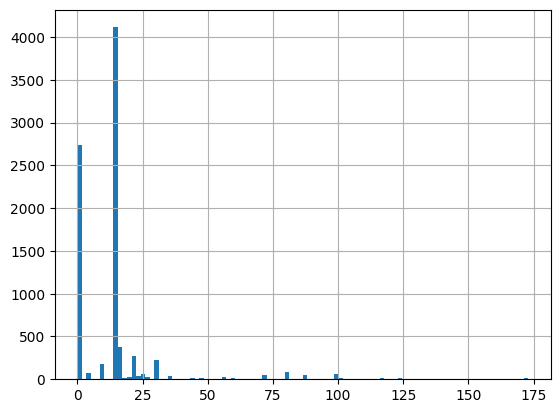

In [23]:
# Data analysis on area_length to determine appropriate danger level binning
length = round(faults['area_length'])
print(length.describe())
print(length.hist(bins = 100))

In [24]:
# Fill in values of danger_index column

# area_length 0 km  ->  low danger_index    (0 area means that the fault theoretically cannot cause earthquakes at all)
# area_length (0, 16) km  ->  medium danger_index
# area_length [16, 35) km  ->  high danger_index
# area_length 35+ km  ->  very high danger_index

for i in range(len(faults.index)):
    if (faults['area_length'][i] == 0):
        faults['danger_index'][i] = 'low'
    elif (faults['area_length'][i] > 0) & (faults['area_length'][i] < 16):
        faults['danger_index'][i] = 'medium'
    elif (faults['area_length'][i] >= 16) & (faults['area_length'][i] < 35):
        faults['danger_index'][i] = 'high'
    elif (faults['area_length'][i] >= 35):
        faults['danger_index'][i] = 'very high'

# View faults data
faults

,lon1,lat1,dep1,lon2,lat2,dep2,lon3,lat3,dep3,lon4,lat4,dep4,area_length,danger_index
0,358.257,71.685,0.0,359.025,71.815,0.0,358.257000,71.685000,15.0,359.025000,71.815000,15.0,15.000000,medium
1,357.601,71.592,0.0,358.257,71.685,0.0,357.601000,71.592000,15.0,358.257000,71.685000,15.0,15.000000,medium
2,357.063,71.500,0.0,357.601,71.592,0.0,357.063000,71.500000,15.0,357.601000,71.592000,15.0,15.000000,medium
3,356.308,71.398,0.0,357.063,71.500,0.0,356.308000,71.398000,15.0,357.063000,71.500000,15.0,15.000000,medium
4,355.928,71.490,0.0,356.308,71.398,0.0,355.928000,71.490000,15.0,356.308000,71.398000,15.0,15.000000,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8629,76.943,42.720,0.0,77.168,42.738,0.0,76.931435,42.797853,15.0,77.156435,42.815853,15.0,17.344224,high
8630,76.690,42.708,0.0,76.943,42.720,0.0,76.683046,42.786152,15.0,76.936046,42.798152,15.0,17.344461,high
8631,76.521,42.706,0.0,76.690,42.708,0.0,76.519196,42.784310,15.0,76.688196,42.786310,15.0,17.344588,high
8632,76.270,42.719,0.0,76.521,42.706,0.0,76.277261,42.797137,15.0,76.528261,42.784137,15.0,17.344445,high


In [25]:
# Delete unnecessary columns, and view data
faults = faults[['lon1', 'lat1', 'lon2', 'lat2', 'danger_index']]
faults

,lon1,lat1,lon2,lat2,danger_index
0,358.257,71.685,359.025,71.815,medium
1,357.601,71.592,358.257,71.685,medium
2,357.063,71.500,357.601,71.592,medium
3,356.308,71.398,357.063,71.500,medium
4,355.928,71.490,356.308,71.398,medium
...,...,...,...,...,...
8629,76.943,42.720,77.168,42.738,high
8630,76.690,42.708,76.943,42.720,high
8631,76.521,42.706,76.690,42.708,high
8632,76.270,42.719,76.521,42.706,high


In [26]:
# Save
faults.to_csv('faults_danger_index.csv')

# Create a version of the fault data correctly formatted for plotting

In [27]:
# Load saved faults data
faults = pd.read_csv('faults_danger_index.csv')
faults = faults.drop(['Unnamed: 0'], axis=1) # remove unnecessary column

# Round everything to 3 decimal places
faults = faults.round(3)

# Create new dataframe to store the correctly formatted faults data
faults_array = np.zeros((3*len(faults), 3)) # initialize numpy array of correct size containing only 0s
faults_columns = ['lat', 'lon', 'danger'] # set column names of new dataframe
faults_data = pd.DataFrame(faults_array, columns=faults_columns) # convert numpy array to dataframe with the specified column names
faults_data[['lat', 'lon', 'danger']] = np.nan # set all values in the dataframe to NaN

# Fill in the values of faults_data
for i in range(len(faults.index)):
    index = i*3
    faults_data['lat'][index] = faults['lat1'][i]
    faults_data['lon'][index] = faults['lon1'][i]
    faults_data['lat'][index+1] = faults['lat2'][i]
    faults_data['lon'][index+1] = faults['lon2'][i]
    faults_data['danger'][index:(index+3)] = faults['danger_index'][i]

# Save and view correctly formatted faults_data
faults_data.to_csv('faults_lines_danger.csv')
faults_data

/var/folders/qc/qz8fv61s4xs8w475xp4n7d840000gn/T/ipykernel_15678/1220377388.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  faults_data['lat'][index] = faults['lat1'][i]
/var/folders/qc/qz8fv61s4xs8w475xp4n7d840000gn/T/ipykernel_15678/1220377388.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  faults_data['lon'][index] = faults['lon1'][i]
/var/folders/qc/qz8fv61s4xs8w475xp4n7d840000gn/T/ipykernel_15678/1220377388.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexin

,lat,lon,danger
0,71.685,358.257,medium
1,71.815,359.025,medium
2,NaN,NaN,medium
3,71.592,357.601,medium
4,71.685,358.257,medium
...,...,...,...
25897,42.706,76.521,high
25898,NaN,NaN,high
25899,42.761,75.959,high
25900,42.719,76.270,high
